# DAI-101 Assignment 1
- Name: `Sai Revanth Gudipati`
- Enrollment No: `23116037`
- Branch: `ECE`

# Air Quality Index (AQI) Analysis

The Air Quality Index (AQI) is a metric used to communicate how polluted the air is.

### AQI Scale and Categories

AQI typically ranges from 0 to 500:

![AQI levels](images/aqi_levels.png)

*Image taken from CPCB AQI bulletin*

### Measured Pollutants

The AQI considers several key pollutants:

- PM2.5 (Fine particulate matter)
- PM10 (Coarse particulate matter)
- O3 (Ozone)
- NO2 (Nitrogen dioxide)
- SO2 (Sulfur dioxide)
- CO (Carbon monoxide)

![Pollutants composition](images/air_quality_index_standards_CPCB_650.jpg)

In [39]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [40]:
bengaluru_df = pd.read_csv(r'AQI_Indian_cities/bengaluru_combined.csv')
chennai_df = pd.read_csv(r'AQI_Indian_cities/chennai_combined.csv')
delhi_df = pd.read_csv(r'AQI_Indian_cities/delhi_combined.csv')
hyderabad_df = pd.read_csv(r'AQI_Indian_cities/hyderabad_combined.csv')
kolkata_df = pd.read_csv(r'AQI_Indian_cities/kolkata_combined.csv')
mumbai_df = pd.read_csv(r'AQI_Indian_cities/mumbai_combined.csv')
gwalior_df = pd.read_csv(r'AQI_Indian_cities/gwalior_combined.csv')
jaipur_df = pd.read_csv(r'AQI_Indian_cities/jaipur_combined.csv')
lucknow_df = pd.read_csv(r'AQI_Indian_cities/lucknow_combined.csv')
visakhapatnam_df = pd.read_csv(r'AQI_Indian_cities/visakhapatnam_combined.csv')

cities = {
    "Bengaluru": bengaluru_df,
    "Chennai": chennai_df,
    "Delhi": delhi_df,
    "Gwalior": gwalior_df,
    "Hyderabad": hyderabad_df,
    "Jaipur": jaipur_df,
    "Kolkata": kolkata_df,
    "Lucknow": lucknow_df,
    "Mumbai": mumbai_df,
    "Visakhapatnam": visakhapatnam_df,
}

In [41]:
bengaluru_df.head()

,Timestamp,Location,PM2.5,PM10,NO2,NH3,SO2,CO,O3
0,01-01-2020,Bengaluru - Silk Board,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,02-01-2020,Bengaluru - Silk Board,43.67,134.00,20.28,10.98,3.41,0.91,21.82
2,03-01-2020,Bengaluru - Silk Board,30.58,74.42,15.17,12.10,3.27,0.96,23.31
3,04-01-2020,Bengaluru - Silk Board,66.35,155.68,42.90,11.75,3.26,2.54,29.70
4,05-01-2020,Bengaluru - Silk Board,48.00,99.13,18.56,9.79,2.95,1.14,31.01


# Data Preprocessing

## Feature Engineering

In [42]:
# function to extract year, month, day, weekday, and check if it's a weekend or not

def extract_datetime_features(df):
    df['Timestamp'] = pd.to_datetime(df['Timestamp'], format='%d-%m-%Y')
    df['Year'] = pd.to_datetime(df['Timestamp']).dt.year
    df['Month'] = pd.to_datetime(df['Timestamp']).dt.month
    df['Day'] = pd.to_datetime(df['Timestamp']).dt.day
    df["Weekday"] = df["Timestamp"].dt.weekday
    df["Weekend"] = df["Weekday"].apply(lambda x: 1 if x >= 5 else 0)

In [43]:
for city, df in cities.items():
    extract_datetime_features(df)

In [44]:
visakhapatnam_df.head()

,Timestamp,Location,PM2.5,PM10,NO2,NH3,SO2,CO,O3,Year,Month,Day,Weekday,Weekend
0,2020-01-01,Visakhapatnam - GVM Corporation,64.72,101.79,26.59,11.42,8.10,1.14,70.51,2020,1,1,2,0
1,2020-01-02,Visakhapatnam - GVM Corporation,50.87,91.55,30.49,11.40,8.83,1.09,59.92,2020,1,2,3,0
2,2020-01-03,Visakhapatnam - GVM Corporation,52.59,90.53,23.28,11.74,7.55,1.08,61.80,2020,1,3,4,0
3,2020-01-04,Visakhapatnam - GVM Corporation,21.82,48.86,21.84,10.36,9.36,0.95,44.17,2020,1,4,5,1
4,2020-01-05,Visakhapatnam - GVM Corporation,16.00,43.07,18.27,10.24,9.04,0.84,52.64,2020,1,5,6,1


## Data Cleaning

### Outliers

In [45]:
# List of pollutant columns
pollutant_columns = ['PM2.5', 'PM10', 'NO2', 'NH3', 'SO2', 'CO', 'O3']

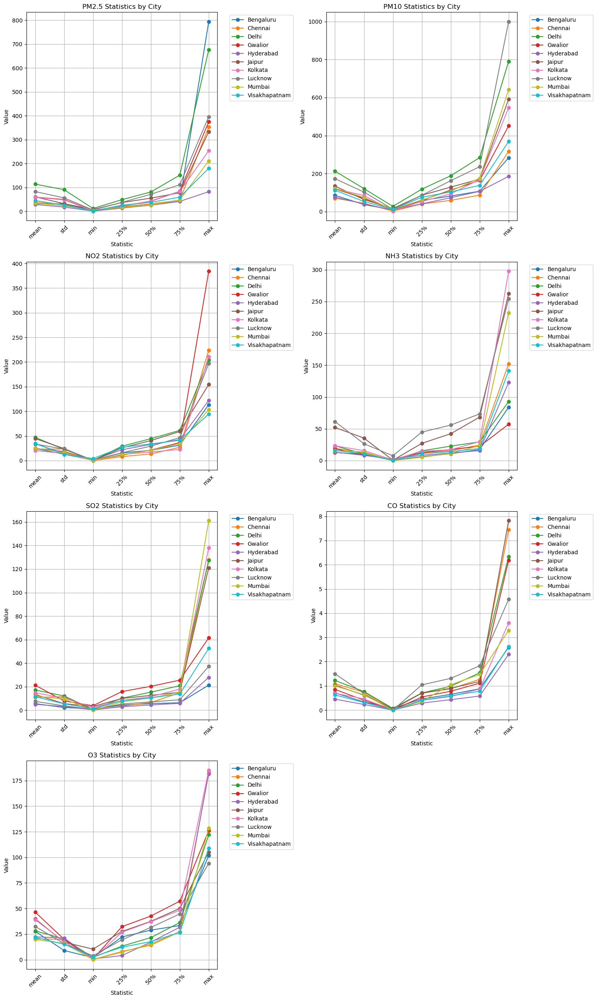

In [46]:
#plotting pollutant statistics
plt.figure(figsize=(15, 25))

for i, pollutant in enumerate(pollutant_columns, 1):
    plt.subplot(4, 2, i)
    
    for city, df in cities.items():
        stats = df[pollutant].describe()[1:]  # Skip count
        plt.plot(stats.index, stats, marker='o', label=city)
    
    plt.title(f'{pollutant} Statistics by City')
    plt.ylabel("Value")
    plt.xlabel("Statistic")
    plt.xticks(rotation=45)
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.grid(True)

plt.tight_layout()
plt.show()

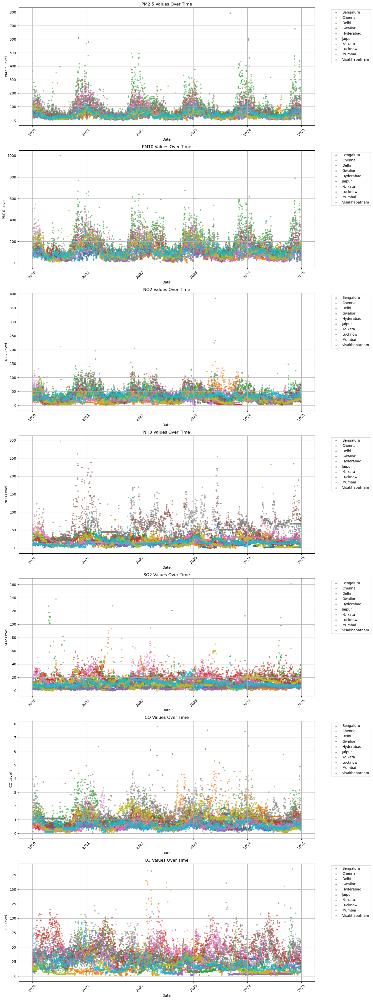

In [47]:
#plot of pollutant values over time
plt.figure(figsize=(15, 40))

for i, pollutant in enumerate(pollutant_columns, 1):
    plt.subplot(7, 1, i)
    
    for city, df in cities.items():
        plt.scatter(df['Timestamp'], df[pollutant], label=city, alpha=0.5, s=10)
    
    plt.title(f'{pollutant} Values Over Time')
    plt.xlabel('Date')
    plt.ylabel(f'{pollutant} Level')
    plt.xticks(rotation=45)
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.grid(True)

plt.tight_layout()
plt.show()


There are many outliers in the data due to which the statistics of the variables deviate drastically from the actual values. They need to be removed.

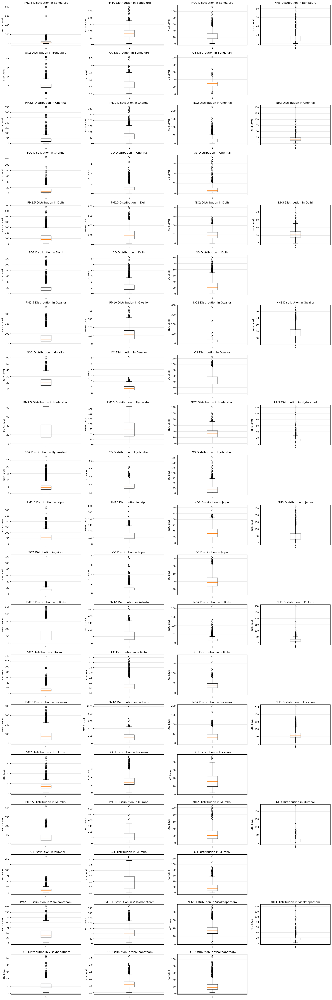

In [48]:
# Calculate number of cities and pollutants
n_cities = len(cities)
n_pollutants = len(pollutant_columns)
n_pollutants_row1 = 4  # first row of each city
n_pollutants_row2 = 3  # second row of each city

# Create figure
plt.figure(figsize=(20, 6 * n_cities))

# For each city
for city_idx, (city, df) in enumerate(cities.items()):
    # First row of pollutants (4)
    for poll_idx in range(n_pollutants_row1):
        plt.subplot(n_cities*2, n_pollutants_row1, city_idx*2*n_pollutants_row1 + poll_idx + 1)
        plt.boxplot(df[pollutant_columns[poll_idx]].dropna())
        plt.title(f'{pollutant_columns[poll_idx]} Distribution in {city}')
        plt.ylabel(f'{pollutant_columns[poll_idx]} Level')
        plt.grid(True, alpha=0.3)
    
    # Second row of pollutants (3)
    for poll_idx in range(n_pollutants_row1, n_pollutants):
        plt.subplot(n_cities*2, n_pollutants_row1, 
                   (city_idx*2 + 1)*n_pollutants_row1 + (poll_idx - n_pollutants_row1) + 1)
        plt.boxplot(df[pollutant_columns[poll_idx]].dropna())
        plt.title(f'{pollutant_columns[poll_idx]} Distribution in {city}')
        plt.ylabel(f'{pollutant_columns[poll_idx]} Level')
        plt.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()


In [49]:
def remove_outliers_iqr(df, columns):
    df_clean = df.copy()
    
    for column in columns:
        # Calculate Q1, Q3, and IQR
        Q1 = df[column].quantile(0.25)
        Q3 = df[column].quantile(0.75)
        IQR = Q3 - Q1
        
        # Define bounds for outliers (1.5 * IQR is a common choice)
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR
        
        # Remove rows with outliers, keeping NaN values
        mask = (df_clean[column] >= lower_bound) & (df_clean[column] <= upper_bound)
        df_clean = df_clean[mask | df_clean[column].isna()]
    
    return df_clean

# Apply outlier removal to each city
cities_cleaned_iqr = {}
for city, df in cities.items():
    cities_cleaned_iqr[city] = remove_outliers_iqr(df, pollutant_columns)
    print(f"Processing {city}...")

Processing Bengaluru...
Processing Chennai...
Processing Delhi...
Processing Gwalior...
Processing Hyderabad...
Processing Jaipur...
Processing Kolkata...
Processing Lucknow...
Processing Mumbai...
Processing Visakhapatnam...


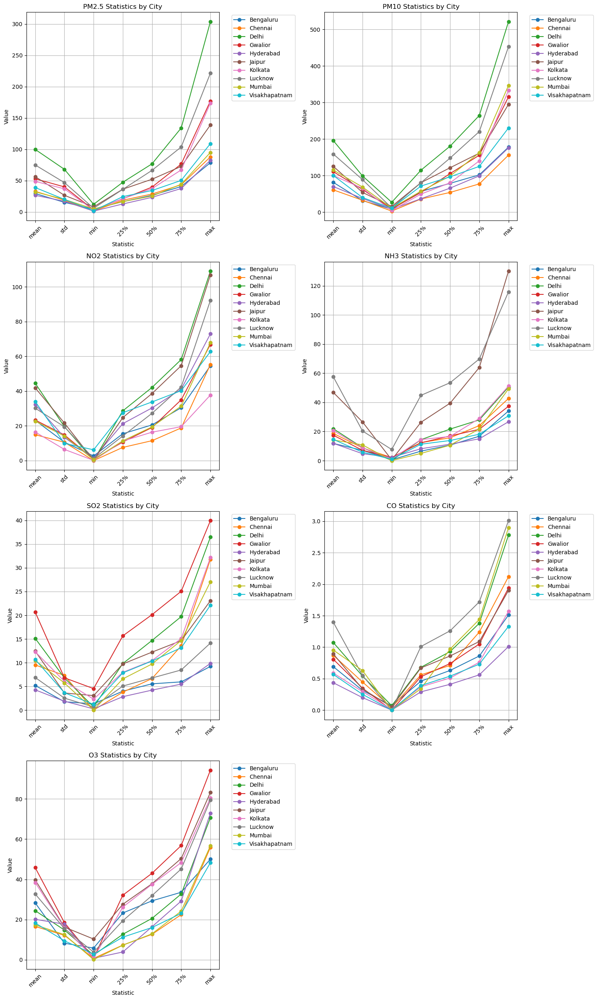

In [50]:
#plotting pollutant statistics
plt.figure(figsize=(15, 25))

for i, pollutant in enumerate(pollutant_columns, 1):
    plt.subplot(4, 2, i)
    
    for city, df in cities_cleaned_iqr.items():
        stats = df[pollutant].describe()[1:]  # Skip count
        plt.plot(stats.index, stats, marker='o', label=city)
    
    plt.title(f'{pollutant} Statistics by City')
    plt.ylabel("Value")
    plt.xlabel("Statistic")
    plt.xticks(rotation=45)
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.grid(True)

plt.tight_layout()
plt.show()

75%ile points and max points have gotten closer because the outliers have been removed. Now we can proceed with other data cleaning processes.

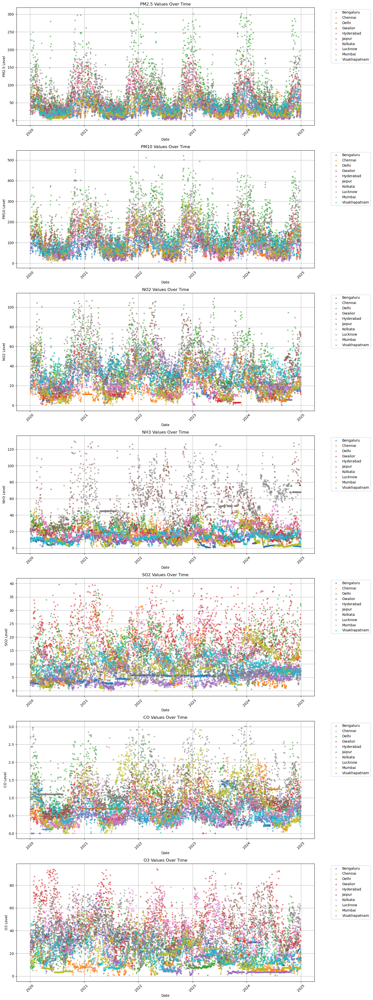

In [51]:
#plot of pollutant values over time
plt.figure(figsize=(15, 40))

for i, pollutant in enumerate(pollutant_columns, 1):
    plt.subplot(7, 1, i)
    
    for city, df in cities_cleaned_iqr.items():
        plt.scatter(df['Timestamp'], df[pollutant], label=city, alpha=0.5, s=10)
    
    plt.title(f'{pollutant} Values Over Time')
    plt.xlabel('Date')
    plt.ylabel(f'{pollutant} Level')
    plt.xticks(rotation=45)
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.grid(True)

plt.tight_layout()
plt.show()


In [52]:
for city, df in cities_cleaned_iqr.items():
    print(f"{city}: {len(df)} rows")

Bengaluru: 1573 rows
Chennai: 1267 rows
Delhi: 1495 rows
Gwalior: 1629 rows
Hyderabad: 1592 rows
Jaipur: 1535 rows
Kolkata: 1450 rows
Lucknow: 1573 rows
Mumbai: 1624 rows
Visakhapatnam: 1455 rows


In [53]:
cities = cities_cleaned_iqr

### Null values

In [54]:
#check for null values
print("Null values after filling:")
for city, df in cities.items():
    print(city)
    print(df.isnull().sum())
    print("\n")

Null values after filling:
Bengaluru
Timestamp      0
Location       0
PM2.5         73
PM10          73
NO2           99
NH3           98
SO2          152
CO            74
O3           127
Year           0
Month          0
Day            0
Weekday        0
Weekend        0
dtype: int64


Chennai
Timestamp      0
Location       0
PM2.5         55
PM10         448
NO2           51
NH3          480
SO2           53
CO            42
O3            54
Year           0
Month          0
Day            0
Weekday        0
Weekend        0
dtype: int64


Delhi
Timestamp     0
Location      0
PM2.5        13
PM10         16
NO2          19
NH3          21
SO2          42
CO           26
O3           16
Year          0
Month         0
Day           0
Weekday       0
Weekend       0
dtype: int64


Gwalior
Timestamp     0
Location      0
PM2.5        36
PM10         38
NO2          40
NH3          40
SO2          35
CO           55
O3           36
Year          0
Month         0
Day           0
Week

There are missing values in the pollutant columns of the datasets. They will be filled with the median of the values from the same month of the same year.

In [55]:
def fill_null_values(df, columns):
    # Create a copy of the dataframe to avoid modifying the original
    df_clean = df.copy()
    
    for column in columns:
        # Fill null values with the median of the same month and year
        df_clean[column] = df_clean.groupby(['Year', 'Month'])[column].transform(
            lambda x: x.fillna(x.median())
        )
        
        # If any nulls remain (e.g., if entire month was null), fill with overall median
        df_clean[column] = df_clean[column].fillna(df_clean[column].median())
    
    return df_clean

In [56]:
#filling null values
for city, df in cities.items():
    cities[city] = fill_null_values(df, pollutant_columns)

In [57]:
#check for null values
print("Null values after filling:")
for city, df in cities.items():
    print(city)
    print(df.isnull().sum())
    print("\n")

Null values after filling:
Bengaluru
Timestamp    0
Location     0
PM2.5        0
PM10         0
NO2          0
NH3          0
SO2          0
CO           0
O3           0
Year         0
Month        0
Day          0
Weekday      0
Weekend      0
dtype: int64


Chennai
Timestamp    0
Location     0
PM2.5        0
PM10         0
NO2          0
NH3          0
SO2          0
CO           0
O3           0
Year         0
Month        0
Day          0
Weekday      0
Weekend      0
dtype: int64


Delhi
Timestamp    0
Location     0
PM2.5        0
PM10         0
NO2          0
NH3          0
SO2          0
CO           0
O3           0
Year         0
Month        0
Day          0
Weekday      0
Weekend      0
dtype: int64


Gwalior
Timestamp    0
Location     0
PM2.5        0
PM10         0
NO2          0
NH3          0
SO2          0
CO           0
O3           0
Year         0
Month        0
Day          0
Weekday      0
Weekend      0
dtype: int64


Hyderabad
Timestamp    0
Location     0
P

### Duplicates

In [58]:
# Check for duplicates in each dataset
print("Number of duplicates in each dataset:")
for city, df in cities.items():
    print(f"{city}: {df.duplicated().sum()}")

Number of duplicates in each dataset:
Bengaluru: 0
Chennai: 0
Delhi: 0
Gwalior: 0
Hyderabad: 0
Jaipur: 0
Kolkata: 0
Lucknow: 0
Mumbai: 0
Visakhapatnam: 0


# Exploratory Data Analysis

### Combine all dataframes into one

In [59]:
# Create a list of dataframes with city name added
dfs = []
for city, df in cities.items():
    df_copy = df.copy()
    df_copy['City'] = city
    dfs.append(df_copy)

# Concatenate all dataframes
combined_df = pd.concat(dfs, ignore_index=True)

# Print information about the combined dataset
print("Dataset Information:")
print("-------------------")
combined_df.info()

print("\nDescriptive Statistics:")
print("----------------------")
print(combined_df.describe())

Dataset Information:
-------------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15193 entries, 0 to 15192
Data columns (total 15 columns):
 #   Column     Non-Null Count  Dtype         
---  ------     --------------  -----         
 0   Timestamp  15193 non-null  datetime64[ns]
 1   Location   15193 non-null  object        
 2   PM2.5      15193 non-null  float64       
 3   PM10       15193 non-null  float64       
 4   NO2        15193 non-null  float64       
 5   NH3        15193 non-null  float64       
 6   SO2        15193 non-null  float64       
 7   CO         15193 non-null  float64       
 8   O3         15193 non-null  float64       
 9   Year       15193 non-null  int32         
 10  Month      15193 non-null  int32         
 11  Day        15193 non-null  int32         
 12  Weekday    15193 non-null  int32         
 13  Weekend    15193 non-null  int64         
 14  City       15193 non-null  object        
dtypes: datetime64[ns](1), float64(7), int32(4), in

In [60]:
combined_df

,Timestamp,Location,PM2.5,PM10,NO2,NH3,SO2,CO,O3,Year,Month,Day,Weekday,Weekend,City
0,2020-01-01,Bengaluru - Silk Board,38.05,97.70,21.34,10.98,3.07,1.09,30.97,2020,1,1,2,0,Bengaluru
1,2020-01-02,Bengaluru - Silk Board,43.67,134.00,20.28,10.98,3.41,0.91,21.82,2020,1,2,3,0,Bengaluru
2,2020-01-03,Bengaluru - Silk Board,30.58,74.42,15.17,12.10,3.27,0.96,23.31,2020,1,3,4,0,Bengaluru
3,2020-01-05,Bengaluru - Silk Board,48.00,99.13,18.56,9.79,2.95,1.14,31.01,2020,1,5,6,1,Bengaluru
4,2020-01-06,Bengaluru - Silk Board,23.75,63.34,17.21,7.40,2.82,1.08,25.82,2020,1,6,0,0,Bengaluru
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15188,2024-12-25,Visakhapatnam - GVM Corporation,32.71,44.51,34.20,6.91,6.23,0.47,13.32,2024,12,25,2,0,Visakhapatnam
15189,2024-12-26,Visakhapatnam - GVM Corporation,20.97,35.56,35.15,5.88,7.39,0.31,9.03,2024,12,26,3,0,Visakhapatnam
15190,2024-12-27,Visakhapatnam - GVM Corporation,71.42,110.04,37.20,11.92,8.04,0.52,14.81,2024,12,27,4,0,Visakhapatnam
15191,2024-12-28,Visakhapatnam - GVM Corporation,56.93,96.62,52.17,8.70,7.04,0.63,10.82,2024,12,28,5,1,Visakhapatnam


City column is added to generalise the data of the location to the whole city and make neat plots with short location names.

### Calculate AQI

In [61]:
# Define breakpoints for each pollutant based on Indian AQI standards
breakpoints = {
    "PM2.5": [
        (0, 30, 0, 50),
        (31, 60, 51, 100),
        (61, 90, 101, 200),
        (91, 120, 201, 300),
        (121, 250, 301, 400),
        (251, 500, 401, 500),
    ],
    "PM10": [
        (0, 50, 0, 50),
        (51, 100, 51, 100),
        (101, 250, 101, 200),
        (251, 350, 201, 300),
        (351, 430, 301, 400),
        (431, 600, 401, 500),
    ],
    "NO2": [
        (0, 40, 0, 50),
        (41, 80, 51, 100),
        (81, 180, 101, 200),
        (181, 280, 201, 300),
        (281, 400, 301, 400),
        (401, 540, 401, 500),
    ],
    "NH3": [
        (0, 200, 0, 50),
        (201, 400, 51, 100),
        (401, 800, 101, 200),
        (801, 1200, 201, 300),
        (1201, 1800, 301, 400),
        (1801, 2400, 401, 500),
    ],
    "SO2": [
        (0, 40, 0, 50),
        (41, 80, 51, 100),
        (81, 380, 101, 200),
        (381, 800, 201, 300),
        (801, 1600, 301, 400),
        (1601, 2000, 401, 500),
    ],
    "CO": [
        (0, 1, 0, 50),
        (1.1, 2, 51, 100),
        (2.1, 10, 101, 200),
        (10.1, 17, 201, 300),
        (17.1, 34, 301, 400),
        (34.1, 50, 401, 500),
    ],
    "O3": [
        (0, 50, 0, 50),
        (51, 100, 51, 100),
        (101, 168, 101, 200),
        (169, 208, 201, 300),
        (209, 748, 301, 400),
        (749, 1000, 401, 500),
    ],
}


# Function to calculate individual AQI sub-index
def calculate_sub_index(concentration, pollutant):
    for bp in breakpoints.get(pollutant, []):
        if bp[0] <= concentration <= bp[1]:
            return ((bp[3] - bp[2]) / (bp[1] - bp[0])) * (concentration - bp[0]) + bp[2]
    return None  # Return None if the concentration is out of range


# Function to calculate overall AQI for a row
def calculate_aqi(row):
    sub_indices = []
    for pollutant in breakpoints.keys():
        if pollutant in row:
            sub_index = calculate_sub_index(row[pollutant], pollutant)
            if sub_index is not None:
                sub_indices.append(sub_index)
    return max(sub_indices) if sub_indices else None  # AQI is the highest sub-index


# Function to apply AQI calculation to a DataFrame, ignoring non-essential columns
def add_aqi_column(df):
    df["AQI"] = df.apply(calculate_aqi, axis=1)
    return df

In [62]:
combined_df = add_aqi_column(combined_df)

In [63]:
combined_df.info()
combined_df.describe()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15193 entries, 0 to 15192
Data columns (total 16 columns):
 #   Column     Non-Null Count  Dtype         
---  ------     --------------  -----         
 0   Timestamp  15193 non-null  datetime64[ns]
 1   Location   15193 non-null  object        
 2   PM2.5      15193 non-null  float64       
 3   PM10       15193 non-null  float64       
 4   NO2        15193 non-null  float64       
 5   NH3        15193 non-null  float64       
 6   SO2        15193 non-null  float64       
 7   CO         15193 non-null  float64       
 8   O3         15193 non-null  float64       
 9   Year       15193 non-null  int32         
 10  Month      15193 non-null  int32         
 11  Day        15193 non-null  int32         
 12  Weekday    15193 non-null  int32         
 13  Weekend    15193 non-null  int64         
 14  City       15193 non-null  object        
 15  AQI        15193 non-null  float64       
dtypes: datetime64[ns](1), float64(8), int32(

,Timestamp,PM2.5,PM10,NO2,NH3,SO2,CO,O3,Year,Month,Day,Weekday,Weekend,AQI
count,15193,15193.000000,15193.000000,15193.000000,15193.000000,15193.000000,15193.000000,15193.000000,15193.000000,15193.000000,15193.000000,15193.000000,15193.000000,15193.000000
mean,2022-07-03 12:27:20.650299648,49.177212,112.039342,28.491871,23.491551,10.780439,0.826360,28.431696,2022.002962,6.534983,15.774106,3.002633,0.286645,117.196779
min,2020-01-01 00:00:00,1.340000,2.970000,0.020000,0.040000,0.010000,0.000000,0.070000,2020.000000,1.000000,1.000000,0.000000,0.000000,12.500000
25%,2021-04-14 00:00:00,21.630000,56.690000,15.200000,11.280000,5.610000,0.460000,14.410000,2021.000000,4.000000,8.000000,1.000000,0.000000,61.888889
50%,2022-07-02 00:00:00,37.160000,95.210000,24.885000,16.940000,9.120000,0.710000,26.160000,2022.000000,7.000000,16.000000,3.000000,0.000000,95.610000
75%,2023-10-06 00:00:00,62.470000,146.650000,38.550000,28.590000,14.490000,1.090000,38.930000,2023.000000,9.000000,23.000000,5.000000,1.000000,139.224631
max,2024-12-31 00:00:00,303.590000,521.450000,109.050000,130.060000,39.950000,3.010000,94.300000,2024.000000,12.000000,31.000000,6.000000,1.000000,453.985503
std,NaN,41.153020,72.334499,17.520220,19.501583,6.864008,0.491712,17.630525,1.420828,3.336626,8.769272,2.004010,0.452209,79.271572


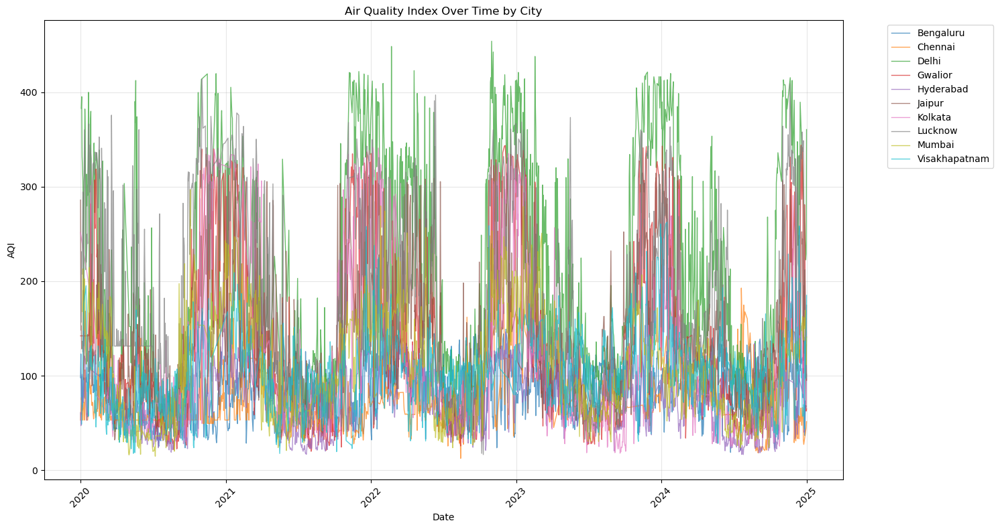

In [64]:
plt.figure(figsize=(15, 8))

for city in combined_df['City'].unique():
    city_data = combined_df[combined_df['City'] == city]
    plt.plot(city_data['Timestamp'], city_data['AQI'], label=city, alpha=0.7, linewidth=1)

plt.title('Air Quality Index Over Time by City')
plt.xlabel('Date')
plt.ylabel('AQI')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True, alpha=0.3)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

## Univariate Analysis

In [65]:
# Calculate basic statistics
basic_stats = combined_df['AQI'].describe()

# Calculate additional statistics
skewness = combined_df['AQI'].skew()

print("Overall AQI Statistics:")
print("=====================")
print(basic_stats)
print(f"\nSkewness: {skewness:.2f}")

Overall AQI Statistics:
count    15193.000000
mean       117.196779
std         79.271572
min         12.500000
25%         61.888889
50%         95.610000
75%        139.224631
max        453.985503
Name: AQI, dtype: float64

Skewness: 1.57


The skewness is positive which means there are less records with AQI values higher than the mean.

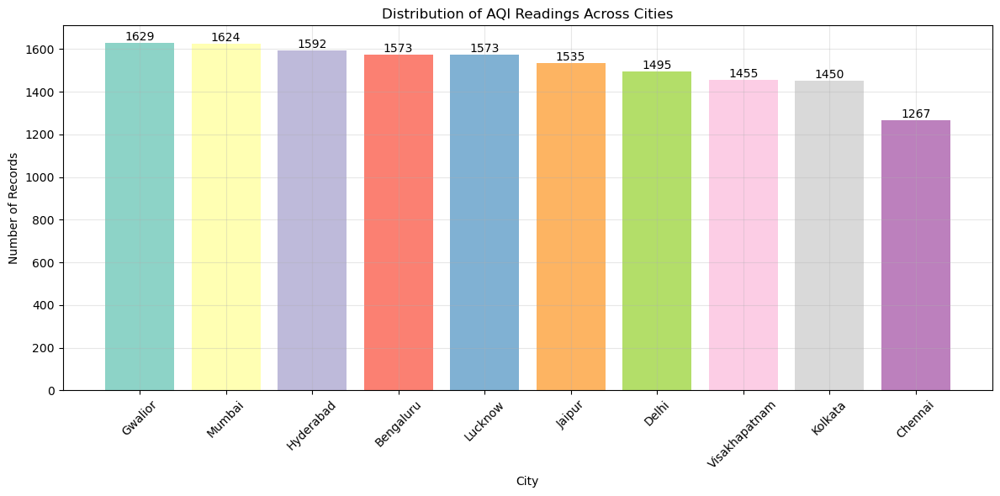

In [66]:
plt.figure(figsize=(12, 6))

# Count number of records per city
city_counts = combined_df['City'].value_counts()

# Create bar plot with different colors
bars = plt.bar(city_counts.index, np.array(city_counts.values), 
               color=sns.color_palette('Set3', len(city_counts)))

# Customize the plot
plt.title('Distribution of AQI Readings Across Cities')
plt.xlabel('City')
plt.ylabel('Number of Records')
plt.xticks(rotation=45)
plt.grid(True, alpha=0.3)

# Add value labels on top of each bar
for bar in bars:
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2., height,
             f'{int(height)}',
             ha='center', va='bottom')

plt.tight_layout()
plt.show()

Frequency distribution of city column - the only categorical column - is plotted which shows the no. of records present of each city after cleaning.

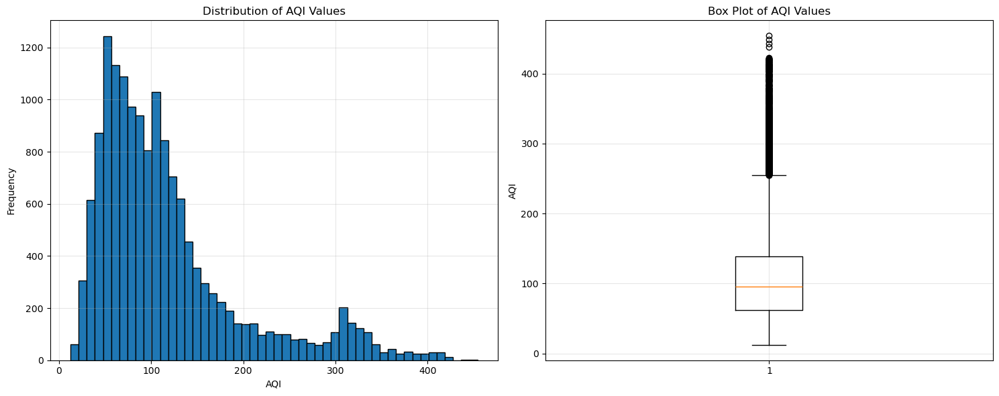

In [67]:
plt.figure(figsize=(15, 6))

# Histogram subplot
plt.subplot(1, 2, 1)
plt.hist(combined_df['AQI'], bins=50, edgecolor='black')
plt.title('Distribution of AQI Values')
plt.xlabel('AQI')
plt.ylabel('Frequency')
plt.grid(True, alpha=0.3)

# Box plot subplot
plt.subplot(1, 2, 2)
plt.boxplot(combined_df['AQI'])
plt.title('Box Plot of AQI Values')
plt.ylabel('AQI')
plt.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

The histogram plot shows that the AQI values are right skewed. The box plot shows that there are many outliers which is because of the highest polluted city which has high AQI everyday. Also the 25%ile, 50%ile and 75%ile levels can be viewed. 50% of the AQI values are less than 100 and 75% of the values are less than 150.

## Bivariate Analysis

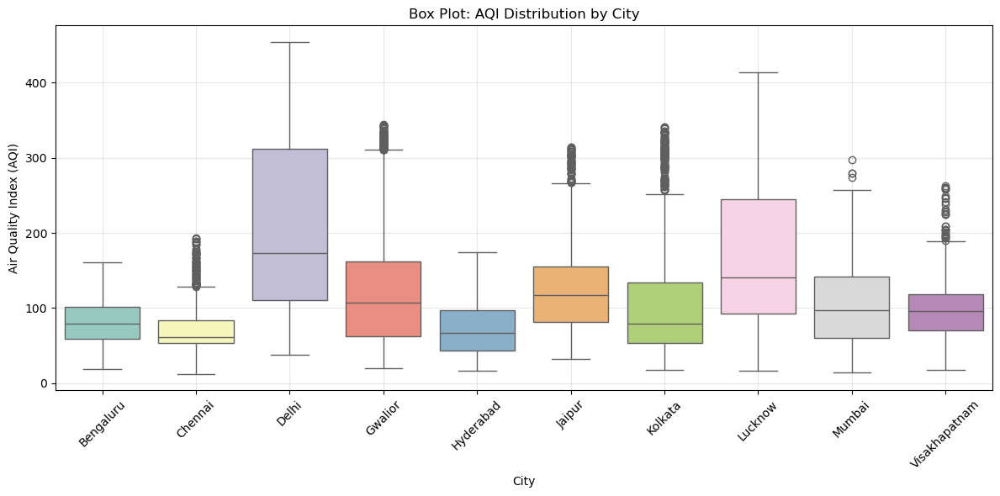

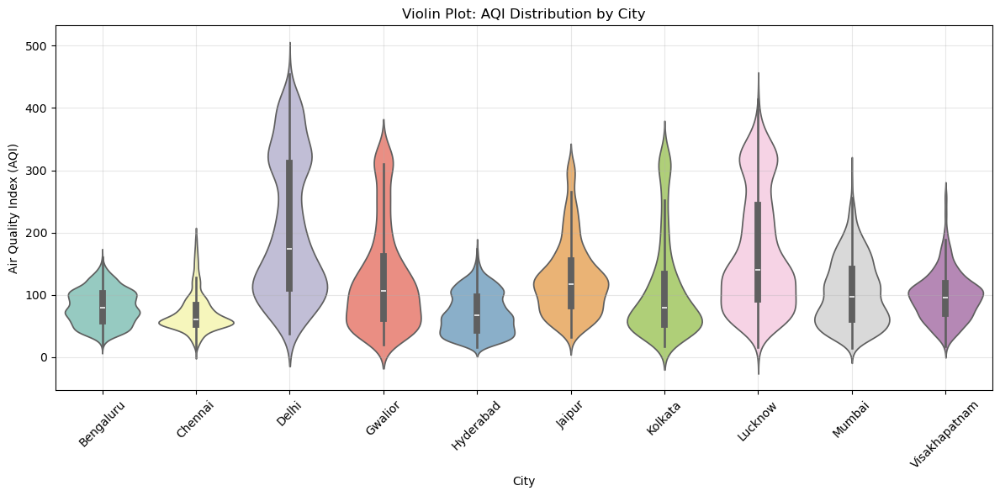

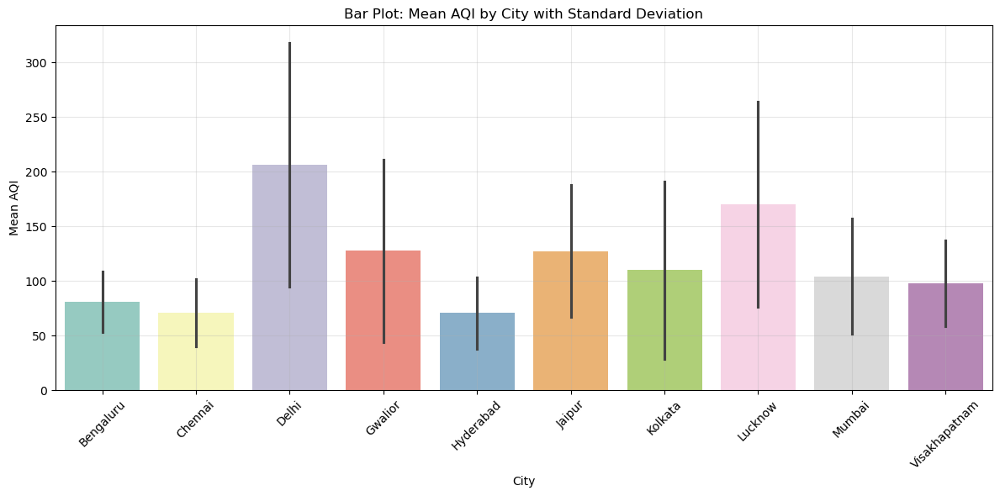

In [68]:
# Box Plot
plt.figure(figsize=(12, 6))
ax = sns.boxplot(x='City', hue='City', y='AQI', data=combined_df, palette='Set3')
plt.xticks(rotation=45)
plt.title('Box Plot: AQI Distribution by City')
plt.xlabel('City')
plt.ylabel('Air Quality Index (AQI)')
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

# Violin Plot
plt.figure(figsize=(12, 6))
ax = sns.violinplot(x='City', hue='City', y='AQI', data=combined_df, palette='Set3')
plt.xticks(rotation=45)
plt.title('Violin Plot: AQI Distribution by City')
plt.xlabel('City')
plt.ylabel('Air Quality Index (AQI)')
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

# Bar Plot with mean AQI and standard deviation
plt.figure(figsize=(12, 6))
ax = sns.barplot(x='City', hue='City', y='AQI', data=combined_df, errorbar='sd', palette='Set3')
plt.xticks(rotation=45)
plt.title('Bar Plot: Mean AQI by City with Standard Deviation')
plt.xlabel('City')
plt.ylabel('Mean AQI')
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

Box plots having shorter boxes have wider violin plots and shorter errorbars (stdev). Shorter boxes means most of the values occurs in a shorter range having less deviation which means that width of violins will be more in the range where the values occur. 

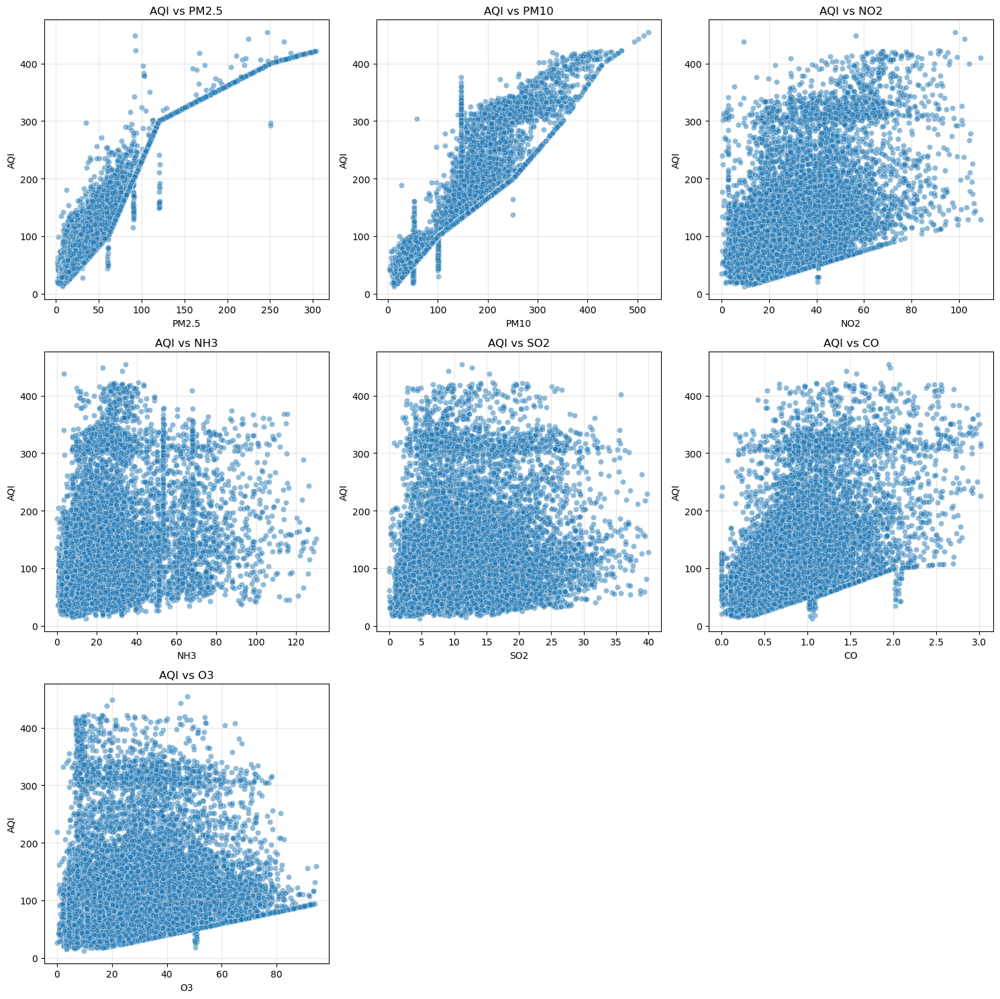

In [69]:
fig, axes = plt.subplots(3, 3, figsize=(15, 15))
axes = axes.ravel()

# Create scatter plots for each pollutant
for i, pollutant in enumerate(pollutant_columns):
    sns.scatterplot(data=combined_df, x=pollutant, y='AQI', alpha=0.5, ax=axes[i])
    axes[i].set_title(f'AQI vs {pollutant}')
    axes[i].grid(True, alpha=0.3)
    
# Remove the empty subplots
axes[-1].remove()
axes[-2].remove()

plt.tight_layout()
plt.show()

A line can be seen in the scatter plots between AQI and PM2.5, PM10, NO2, CO and O3. This means that there is a lower limit that AQI can't cross for a specific pollutant density. The line looks linear with slopes differing in different segments of densities. This shows that the pollutant density is sort of controlling the AQI and setting a lower limit. Even though other pollutant densities are less, the AQI can't get lesser than the limit.

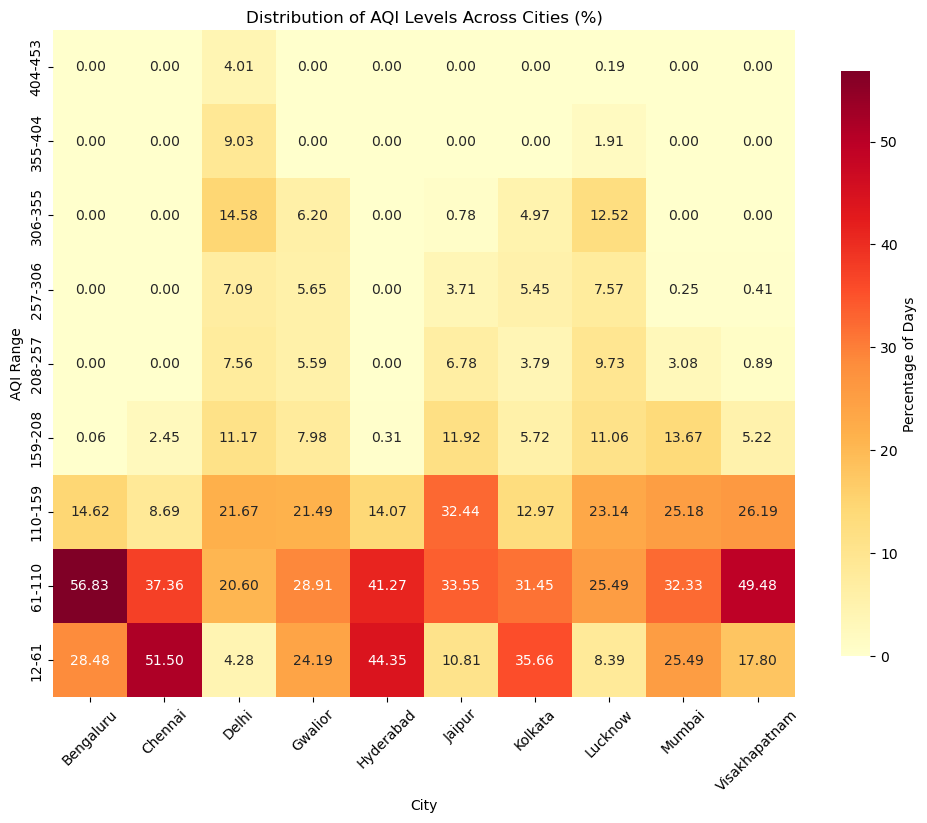

In [70]:
# Create AQI bins
bins = np.linspace(combined_df['AQI'].min(), combined_df['AQI'].max(), 10)
labels = [f'{int(bins[i])}-{int(bins[i+1])}' for i in range(len(bins)-1)]
combined_df['AQI_bin'] = pd.cut(combined_df['AQI'], bins=bins, labels=labels)

# Create crosstab and transpose it
ct = pd.crosstab(combined_df['City'], combined_df['AQI_bin'], normalize='index').T * 100

# Sort the index in descending order to put higher AQI values at the top
ct = ct.sort_index(ascending=False)

# Create heatmap with transposed data
plt.figure(figsize=(10, 12))
sns.heatmap(ct, 
            annot=True, 
            fmt='.2f', 
            cmap='YlOrRd',
            cbar_kws={'label': 'Percentage of Days', 'shrink': 0.5},
            square=True)

plt.title('Distribution of AQI Levels Across Cities (%)')
plt.xlabel('City')
plt.ylabel('AQI Range')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

The heatmap shows the percentage of days, through out the dataset, the AQI is in a specific range in a city. In Chennai, Hyderabad and Kolkata, it can be seen that AQI is in the range 12-61 most of the days. In Bangalore and Vishakapatnam, it is in the range 61-110. In Delhi and Lucknow, it is equally spreadout through out the dataset in the range 61-159 and in the range 159-306 and there is a little increase in the percentage for AQI values in the range 306-355.

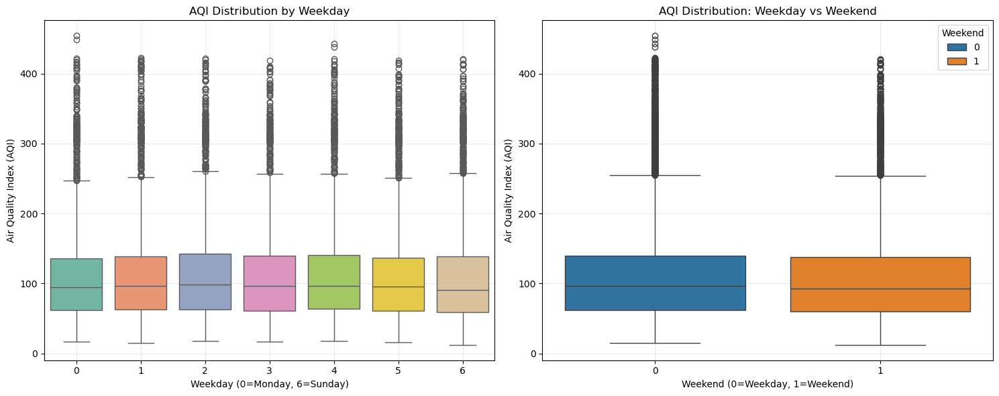


Average AQI on Weekdays: 117.61
Average AQI on Weekends: 116.17


In [71]:
plt.figure(figsize=(15, 6))

# First subplot: AQI by Weekday
plt.subplot(1, 2, 1)
sns.boxplot(x='Weekday', y='AQI',hue='Weekday', data=combined_df, palette='Set2', legend=False)
plt.title('AQI Distribution by Weekday')
plt.xlabel('Weekday (0=Monday, 6=Sunday)')
plt.ylabel('Air Quality Index (AQI)')
plt.grid(True, alpha=0.3)

# Second subplot: AQI by Weekend vs Weekday
plt.subplot(1, 2, 2)
sns.boxplot(x='Weekend', y='AQI',hue='Weekend', data=combined_df)
plt.title('AQI Distribution: Weekday vs Weekend')
plt.xlabel('Weekend (0=Weekday, 1=Weekend)')
plt.ylabel('Air Quality Index (AQI)')
plt.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

# Calculate and print average AQI for weekdays and weekends
weekday_mean = combined_df[combined_df['Weekend'] == 0]['AQI'].mean()
weekend_mean = combined_df[combined_df['Weekend'] == 1]['AQI'].mean()

print(f"\nAverage AQI on Weekdays: {weekday_mean:.2f}")
print(f"Average AQI on Weekends: {weekend_mean:.2f}")


The AQI levels are almost same during all days and there's no much difference between weekday and weekend.

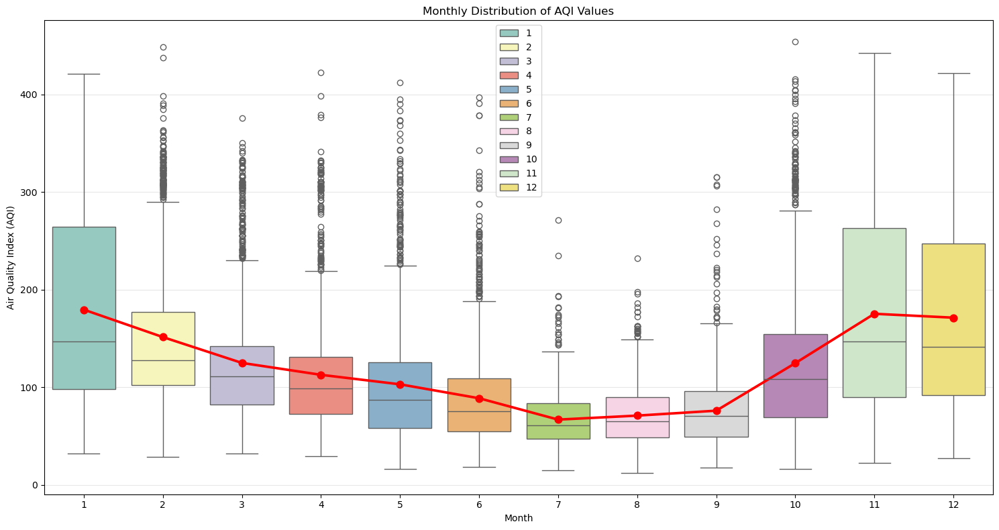

In [72]:
plt.figure(figsize=(15, 8))

# Create box plot
sns.boxplot(data=combined_df, x='Month', y='AQI', hue='Month', palette='Set3')

# Customize the plot
plt.title('Monthly Distribution of AQI Values')
plt.xlabel('Month')
plt.ylabel('Air Quality Index (AQI)')
plt.grid(True, alpha=0.3)

# Remove legend as month is already shown on x-axis
plt.legend([],[], frameon=False)

# Add mean values as points
sns.pointplot(data=combined_df, x='Month', y='AQI', color='red', markers='o', linestyles='-', errorbar=None)

plt.tight_layout()
plt.show()

It is seen that AQI is low during the mid of the year and high during the start and end of the year mostly due to the pollutant densities increasing during winter.

## Multivariate Analysis

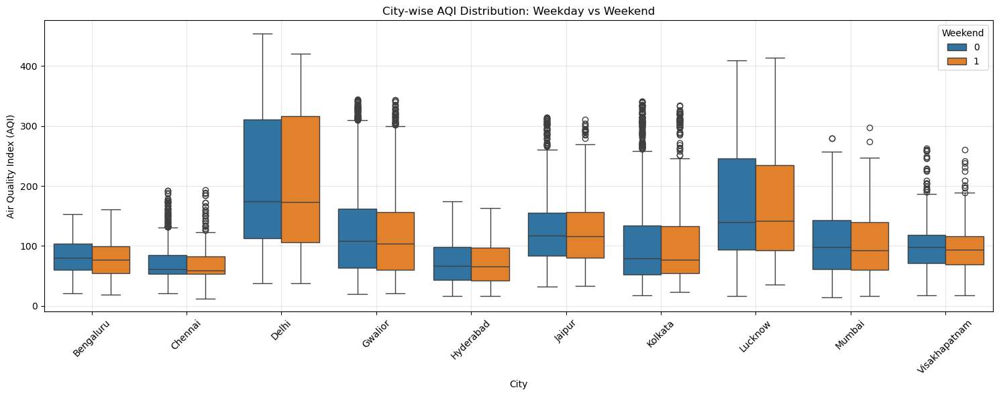

In [73]:
#City-wise analysis
plt.figure(figsize=(15, 6))
sns.boxplot(x="City", y="AQI", hue="Weekend", data=combined_df)
plt.title("City-wise AQI Distribution: Weekday vs Weekend")
plt.xticks(rotation=45)
plt.xlabel("City")
plt.ylabel("Air Quality Index (AQI)")
plt.legend(title="Weekend")
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

City-wise AQI is plotted with respect to weekend (0,1). There's not much difference in the boxes whereas the min and max levels are different in weekday and weekend.

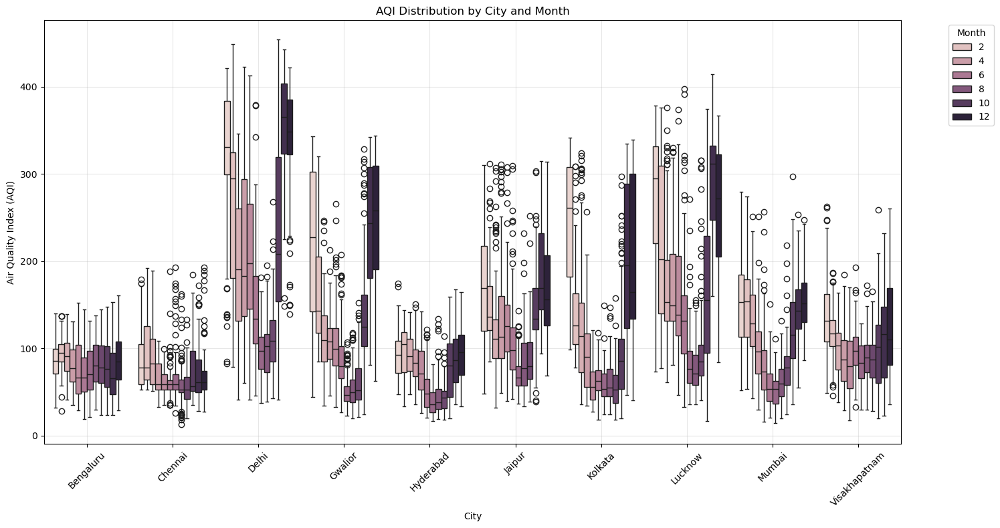

In [74]:
plt.figure(figsize=(15, 8))
sns.boxplot(data=combined_df, x='City', y='AQI', hue='Month')
plt.xticks(rotation=45)
plt.title('AQI Distribution by City and Month')
plt.xlabel('City')
plt.ylabel('Air Quality Index (AQI)')
plt.legend(title='Month', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

Except for Bengaluru, all cities have high AQI during the start and end of the year and low AQI during the mid of the year. Chennai has outliers in the mid of the year which make it similar to Bengaluru.

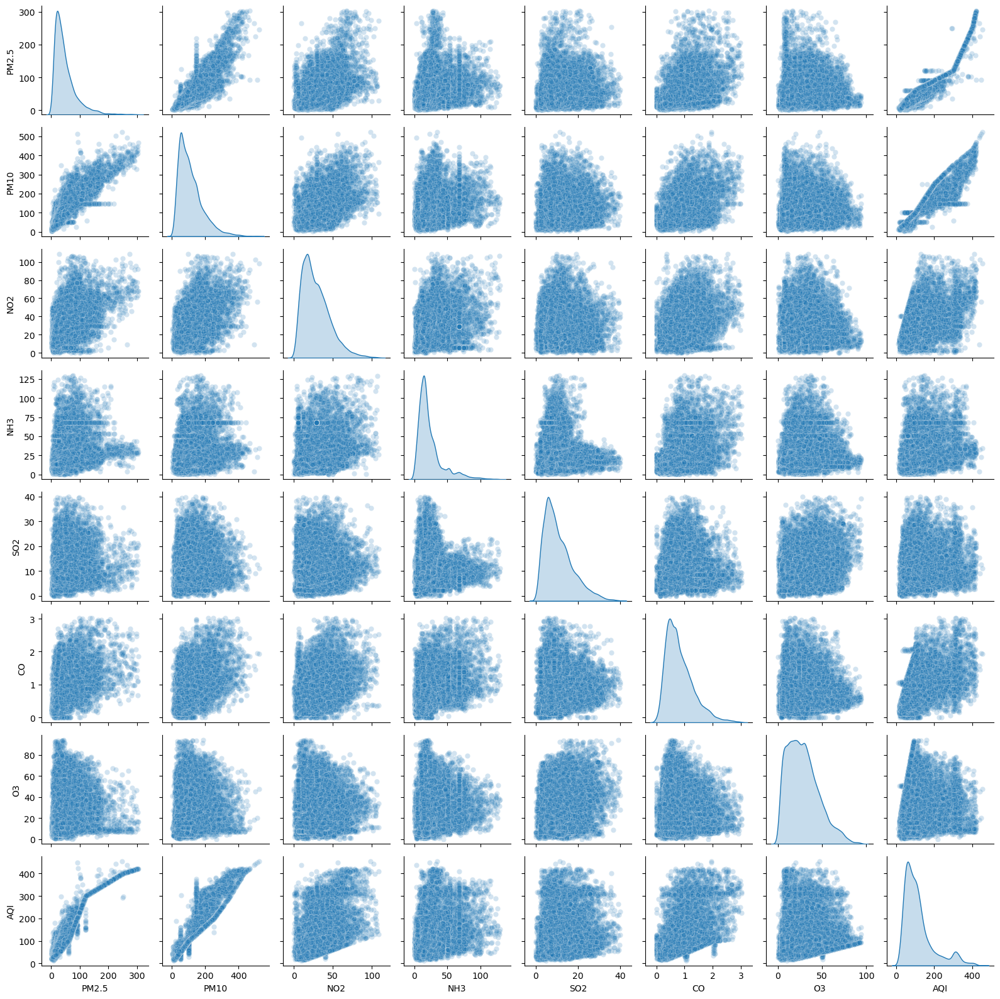

In [75]:
# Create pairplots for pollutants and AQI
sns.pairplot(combined_df[pollutant_columns + ['AQI']], 
             diag_kind='kde',
             plot_kws={'alpha': 0.2},
             height=2)
plt.tight_layout()
plt.show()

AQI, PM2.5 and PM10 have sort of linear relation. The diagonal plots are kde (probability density functions) which are all right-skewed. Most of the other pair plots are triangular. (SO2, NH3) pair plot is kind of L-shaped which says that after a certain threshold of SO2, NH3 is limited to a range and vice versa.

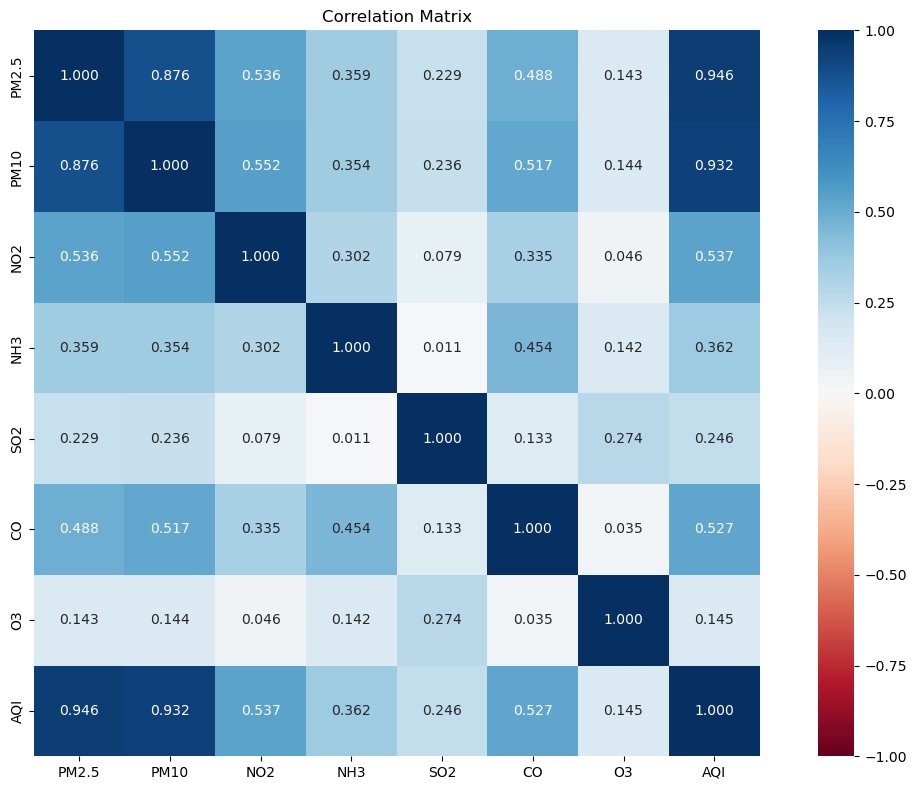

In [76]:
# Create correlation matrix for numeric columns
correlation_matrix = combined_df[pollutant_columns + ['AQI']].corr()

# Create a heatmap using seaborn
plt.figure(figsize=(12, 8))
sns.heatmap(
    correlation_matrix,
    annot=True,
    cmap="RdBu",
    center=0,
    square=True,
    vmin=-1,
    vmax=1,
    fmt=".3f")

plt.title('Correlation Matrix')
plt.tight_layout()
plt.show()

It is seen that AQI, PM2.5 and PM10 are highly correlated with each other. NH3 and CO are slightly less correlated with the 3. Few pairs are not correlated at all (<0.05) like (SO2, NH3), (O3,NO2) and (O3,CO).